<div style="display:flex">
    <img src="https://bse.eu/sites/default/files/bse_logo_small.png" alt="Logo 1">
</div>

# Traffic Signs Detection: Model Training

## Table of Contents

1. **[Part 0: Setup](#part1)**
   - Environment and Imports
   - Helper Functions

2. **[Part 1: Model Training](#part2)**
   - Model 1: Few Shot Training
   - Model 2: Training with 13% of Dataset
   - Model 3: Training with 25% of Dataset
   - Model 4: Training with 50% of Dataset
   - Model 5: Training with full Dataset
   


### Install and Import libraries

In [1]:
#!pip install ultralytics

In [1]:
# Importing Libraries
import os
import cv2
import glob
import shutil
import random
import pathlib
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_theme(style='darkgrid')
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import Video

from tqdm.notebook import trange, tqdm

import yaml
from ultralytics import YOLO

import warnings
warnings.filterwarnings('ignore')

# Setting the random seed for reproducibility
random.seed(42)
np.random.seed(42)

### Utilities functions

In [3]:
# Function to display an image with its bounding boxes
def display_image_with_boxes(image_path, label_file, include_label=True):
    # Load the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Read the label file
    with open(label_file, 'r') as file:
        labels = file.readlines()

    # Draw bounding boxes on the image
    for label in labels:
        parts = label.strip().split()
        class_id = int(parts[0])
        x_center, y_center, width, height = map(float, parts[1:])
        
        # Convert YOLO format to pixel coordinates
        img_height, img_width, _ = image.shape
        x1 = int((x_center - width / 2) * img_width)
        y1 = int((y_center - height / 2) * img_height)
        x2 = int((x_center + width / 2) * img_width)
        y2 = int((y_center + height / 2) * img_height)

        # Draw rectangle
        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
        # Put class ID text
        if include_label:
            cv2.putText(image, class_names[str(class_id)], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
        

    # Display the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show() 

In [4]:
# Function to get the label file path from the image path
def get_label_file(image_path):
    # Replace 'images' with 'labels' in the path
    label_path = image_path.replace('images', 'labels').replace('.jpg', '.txt')
    return label_path

In [5]:
# Set the directory paths
path= os.getcwd()
Image_dir = os.path.join(path, 'data', 'train', 'images')
image_files = os.listdir(Image_dir)

In [ ]:
class_names = {'0': 'Green Light', '1': 'Red Light', '2': 'Speed Limit 10',   '3': 'Speed Limit 100', '4': 'Speed Limit 110', '5': 'Speed Limit 120', '6': 'Speed Limit 20', '7': 'Speed Limit 30', '8': 'Speed Limit 40', '9': 'Speed Limit 50', '10': 'Speed Limit 60', '11': 'Speed Limit 70', '12': 'Speed Limit 80', '13': 'Speed Limit 90', '14': 'Stop'}
# define a updated class names where we skip speed limit 10
class_names_updated = { '0': 'Green Light', '1': 'Red Light', '2': 'Speed Limit 100', '3': 'Speed Limit 110', '4': 'Speed Limit 120', '5': 'Speed Limit 20', '6': 'Speed Limit 30', '7': 'Speed Limit 40', '8': 'Speed Limit 50', '9': 'Speed Limit 60', '10': 'Speed Limit 70', '11': 'Speed Limit 80', '12': 'Speed Limit 90', '13': 'Stop'}

Recall the data distribution

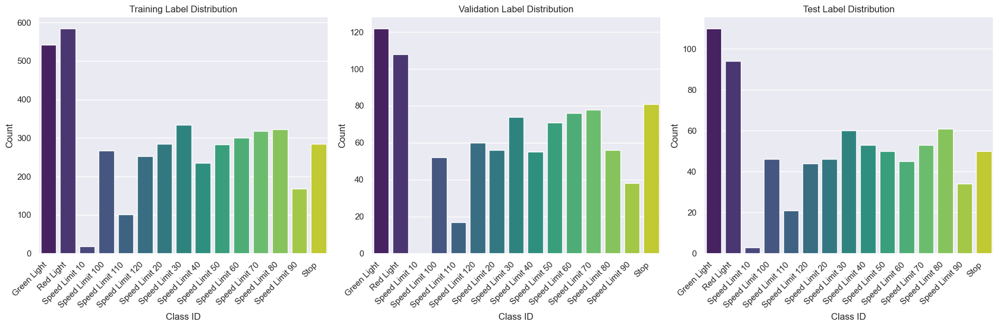

In [13]:
# train
train_label_counts = {label: 0 for label in class_names.values()} 
for label_file in train_labels:
    with open(os.path.join(path, 'data', 'train', 'labels', label_file), 'r') as file:
        for line in file:
            class_id = class_names[line.strip().split()[0]]
            train_label_counts[class_id] += 1
# Convert to DataFrame for easier plotting
train_label_counts_df = pd.DataFrame(list(train_label_counts.items()), columns=['Class ID', 'Count'])

# Validation
val_label_counts = {label: 0 for label in class_names.values()}
for label_file in val_labels:
    with open(os.path.join(path, 'data', 'valid', 'labels', label_file), 'r') as file:
        for line in file:
            class_id = class_names[line.strip().split()[0]]
            val_label_counts[class_id] += 1
# Convert to DataFrame for easier plotting
val_label_counts_df = pd.DataFrame(list(val_label_counts.items()), columns=['Class ID', 'Count'])   

# Test
test_label_counts = {label: 0 for label in class_names.values()}
for label_file in test_labels:
    with open(os.path.join(path, 'data', 'test', 'labels', label_file), 'r') as file:
        for line in file:
            class_id = class_names[line.strip().split()[0]]
            test_label_counts[class_id] += 1
# Convert to DataFrame for easier plotting
test_label_counts_df = pd.DataFrame(list(test_label_counts.items()), columns=['Class ID', 'Count'])


# Create three subplots for train, validation, and test label distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for ax, df, title in zip(axes,
                         [train_label_counts_df, val_label_counts_df, test_label_counts_df],
                         ['Training', 'Validation', 'Test']):
    sns.barplot(x='Class ID', y='Count', data=df, ax=ax, palette='viridis')
    ax.set_title(f'{title} Label Distribution')
    ax.set_xlabel('Class ID')
    ax.set_ylabel('Count')
    # rotate the labels
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()

# Part : Few-Shot Training <a id="part2"></a>

### 2.1 Few-Shot Dataset Creation

In [14]:
# !pip install --upgrade ultralytics ray

We create a function that has as parameters the percentage of data that we want to use and the distribution (label_counts_df) of our traning data. Additionally we have an skip_classes parameter that allows to drop any class we want, in this case we will drop class # 2 because if the extreme class imbalance

Let's create the dataset used for the few-show training of our YOLOv8 classification model. To do so, here are a few considerations to bear in mind in the design:
- We keep the same (approx.) distribution of labels as in the full train dataset, excluding the `Speed Limit 10` label. 
- When selecting the images, we use those that have only the specific class we are looking for (no multi-label images)

In [15]:
def create_few_shot_dataset(path, percentage, label_counts_df, skip_classes=None):
    Image_dir = os.path.join(path, 'data', 'train', 'images')
    label_dir = os.path.join(path, 'data', 'train', 'labels')
    train_labels = os.listdir(label_dir)

    # Create few-shot directories
    few_shot_data_dir = os.path.join(path, f'data/few_shot_{int(percentage*100)}pct')
    few_shot_img_dir = os.path.join(few_shot_data_dir, 'images')
    few_shot_lbl_dir = os.path.join(few_shot_data_dir, 'labels')
    os.makedirs(few_shot_img_dir, exist_ok=True)
    os.makedirs(few_shot_lbl_dir, exist_ok=True)

    # Convert label counts into a dict: {'0': 542, '1': 585, ...}
    label_counts_dict = {str(i): row['Count'] for i, row in label_counts_df.iterrows()}

    if skip_classes is None:
        skip_classes = []

    def copy_few_shot_images(class_id, num_images):
        matching = []
        for lf in train_labels:
            lbl_path = os.path.join(label_dir, lf)
            with open(lbl_path) as f:
                lines = [line.strip() for line in f if line.strip()]
                if lines and all(line.split()[0] == class_id for line in lines):
                    matching.append(lf)

        if len(matching) < num_images:
            print(f"Warning: not enough examples for class {class_id}, requested {num_images}, found {len(matching)}")
            num_images = len(matching)

        for lf in random.sample(matching, num_images):
            img_name = lf.replace('.txt', '.jpg')
            shutil.copy(os.path.join(Image_dir, img_name), os.path.join(few_shot_img_dir, img_name))
            shutil.copy(os.path.join(label_dir, lf), os.path.join(few_shot_lbl_dir, lf))

    # Process all classes
    for class_id, total_count in label_counts_dict.items():
        if class_id in skip_classes:
            continue
        few_shot_count = max(1, int(total_count * percentage))
        copy_few_shot_images(class_id, few_shot_count)

    print(f"Few-shot dataset created with {len(os.listdir(few_shot_img_dir))} images at {percentage*100}%")


In [16]:
train_label_counts_df = pd.DataFrame(train_label_counts_df)  # label counts dataframe
create_few_shot_dataset(path, 0.065, train_label_counts_df, skip_classes=['2'])

Few-shot dataset created with 271 images at 6.5%


Note that before training, we need to create a .yaml file. This a custom ultralytics YOLO dataset configuration in which we define the dataset root directory, relative paths to training and validation a a dictionary of class names

# Part 1: Model Training

## Model 1: Few-Shot Learning

As a baseline, we fine-tuned a pretrained YOLOv8 model on our 10-shot-per-class dataset using no augmentation and default loss. This will serve as a practical lower bound for few-shot object detection.

In [17]:
# Build from YAML and transfer weights
baseline_model = YOLO('yolov8n.pt')  

cfg_path = os.path.join(os.getcwd(), 'data', 'few_shot_data_6.yaml')

# Train the Model !!
result_baseline = baseline_model.train(
    data=cfg_path,
    epochs=25,
    batch=4,
    optimizer='auto',
    name='few_shot_training_6', 
    mosaic=0.0,      # no mosaic augmentation
    hsv_h=0.0, hsv_s=0.0, hsv_v=0.0,  # no HSV color jitter
    fliplr=0.0,      # no horizontal flips
    flipud=0.0       # no vertical flips
)

New https://pypi.org/project/ultralytics/8.3.156 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_data_6.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yo

2025-06-19 11:46:30,671	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_6pct\labels... 271 images, 0 backgrounds, 0 corrupt: 100%|██████████| 271/271 [00:00<00:00, 439.72it/s]

train: New cache created: C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_6pct\labels.cache


val: Fast image access  (ping: 0.20.1 ms, read: 103.045.9 MB/s, size: 21.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs\detect\few_shot_training_6\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\few_shot_training_6
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25     0.582G       1.24      5.176      1.518          3        640: 100%|██████████| 68/68 [00:08<00:00,  8.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.67it/s]

                   all        801        944    0.00986      0.691      0.052     0.0389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25     0.643G     0.9817      4.581      1.305          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.77it/s]

                   all        801        944      0.148      0.245      0.124       0.09



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25     0.646G     0.9445      4.135      1.268          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.69it/s]


                   all        801        944      0.187       0.29      0.162      0.122

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25     0.646G     0.9123      3.922      1.254          4        640: 100%|██████████| 68/68 [00:05<00:00, 11.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.60it/s]

                   all        801        944      0.156      0.322      0.172      0.118



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25     0.646G      0.906      3.827      1.143          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.60it/s]

                   all        801        944      0.188      0.347      0.187      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25     0.648G     0.8969      3.619      1.194          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.75it/s]


                   all        801        944      0.217      0.382      0.211      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25     0.648G     0.8211       3.48      1.112          4        640: 100%|██████████| 68/68 [00:05<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.10it/s]

                   all        801        944      0.237      0.398      0.231      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25     0.648G      0.827      3.287      1.125          4        640: 100%|██████████| 68/68 [00:05<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.48it/s]


                   all        801        944      0.258      0.341      0.237      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25     0.648G      0.762      3.202      1.072          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.30it/s]

                   all        801        944      0.266      0.389      0.266      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25     0.648G     0.7426      3.091      1.056          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.55it/s]


                   all        801        944      0.314      0.381      0.297      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25     0.648G     0.7449       2.94      1.051          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.19it/s]


                   all        801        944      0.313      0.494      0.334      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25     0.648G     0.7411      2.893      1.066          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.68it/s]

                   all        801        944       0.33      0.499      0.338      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25     0.648G     0.7508      2.851      1.051          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.81it/s]


                   all        801        944      0.352      0.439      0.348      0.281

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25     0.648G      0.696      2.689      1.013          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.79it/s]

                   all        801        944      0.405       0.44      0.399      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25     0.648G     0.7372      2.689      1.069          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.80it/s]

                   all        801        944      0.421      0.492      0.406      0.332


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25     0.648G      0.669      2.508      1.016          4        640: 100%|██████████| 68/68 [00:06<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.44it/s]


                   all        801        944      0.433      0.476      0.417      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25     0.648G     0.6351      2.437      1.003          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.77it/s]

                   all        801        944      0.472      0.476      0.444       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25     0.648G     0.6577      2.411     0.9908          4        640: 100%|██████████| 68/68 [00:05<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.83it/s]

                   all        801        944      0.451      0.515      0.465      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25     0.648G       0.62      2.281     0.9577          4        640: 100%|██████████| 68/68 [00:05<00:00, 12.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.49it/s]

                   all        801        944      0.461      0.559      0.477      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25     0.648G     0.6211      2.258     0.9939          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.83it/s]


                   all        801        944      0.496       0.52      0.492      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25     0.648G     0.5817      2.168     0.9588          4        640: 100%|██████████| 68/68 [00:05<00:00, 11.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.01it/s]


                   all        801        944      0.495      0.525      0.496       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25     0.648G       0.61      2.077     0.9589          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.70it/s]

                   all        801        944      0.509       0.56      0.503      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25     0.648G     0.5972      2.023     0.9541          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.80it/s]


                   all        801        944      0.516      0.548      0.508       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25     0.648G     0.5705      2.058      0.951          5        640: 100%|██████████| 68/68 [00:05<00:00, 12.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.61it/s]


                   all        801        944      0.527      0.561       0.52      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25     0.648G     0.5658      1.968     0.9415          3        640: 100%|██████████| 68/68 [00:05<00:00, 12.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.67it/s]

                   all        801        944      0.547      0.544      0.523      0.444



25 epochs completed in 0.102 hours.
Optimizer stripped from runs\detect\few_shot_training_6\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\few_shot_training_6\weights\best.pt, 6.3MB

Validating runs\detect\few_shot_training_6\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 15.57it/s]


                   all        801        944      0.548      0.543      0.523      0.445
           Green Light         87        122      0.642       0.32      0.396      0.215
             Red Light         74        108      0.695       0.38      0.485      0.284
       Speed Limit 100         52         52      0.293      0.538      0.394      0.354
       Speed Limit 110         17         17      0.221      0.412        0.3      0.279
       Speed Limit 120         60         60      0.472      0.467      0.462      0.416
        Speed Limit 20         56         56       0.77      0.661      0.791      0.678
        Speed Limit 30         71         74      0.417      0.705      0.505      0.459
        Speed Limit 40         53         55       0.51      0.643      0.547      0.464
        Speed Limit 50         68         71      0.233       0.15      0.189      0.146
        Speed Limit 60         76         76      0.783      0.658      0.745      0.666
        Speed Limit 7

In [12]:
results_training_fewshot = pd.read_csv(os.path.join((os.getcwd()),"runs","detect","few_shot_training_6","results.csv"))
results_training_fewshot.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
15,16,245.843,0.66899,2.50761,1.01634,0.43251,0.47579,0.41720,0.34550,0.80247,1.92043,1.09977,0.000214,0.000214,0.000214
16,17,259.294,0.63506,2.43694,1.00337,0.47185,0.47598,0.44439,0.37031,0.79732,1.81740,1.10217,0.000193,0.000193,0.000193
17,18,272.590,0.65772,2.41077,0.99082,0.45092,0.51461,0.46456,0.38945,0.79339,1.77768,1.08805,0.000172,0.000172,0.000172
18,19,285.975,0.61998,2.28054,0.95773,0.46132,0.55915,0.47728,0.40192,0.77491,1.79819,1.07477,0.000151,0.000151,0.000151
19,20,299.361,0.62110,2.25816,0.99389,0.49561,0.52000,0.49217,0.41634,0.76787,1.83331,1.06799,0.000130,0.000130,0.000130
20,21,313.301,0.58169,2.16848,0.95882,0.49526,0.52477,0.49633,0.41966,0.75841,1.74579,1.06094,0.000109,0.000109,0.000109
21,22,326.783,0.60998,2.07740,0.95890,0.50850,0.55992,0.50278,0.42429,0.76983,1.68029,1.06287,0.000089,0.000089,0.000089
22,23,340.049,0.59720,2.02281,0.95405,0.51600,0.54795,0.50828,0.42996,0.76869,1.66961,1.06195,0.000068,0.000068,0.000068
23,24,354.015,0.57053,2.05778,0.95099,0.52747,0.56116,0.52022,0.44243,0.75780,1.65084,1.05317,0.000047,0.000047,0.000047
24,25,367.304,0.56576,1.96804,0.94151,0.54665,0.54363,0.52308,0.44413,0.75050,1.65572,1.05081,0.000026,0.000026,0.000026


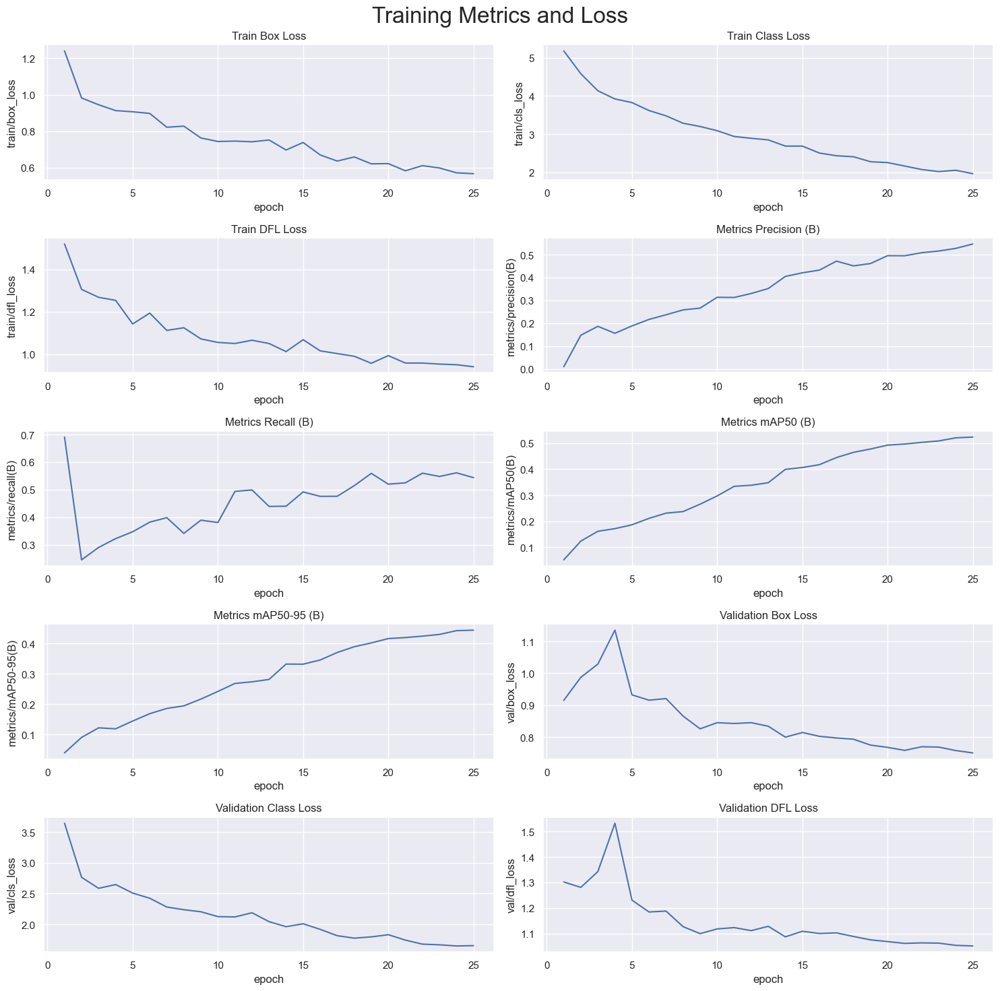

In [21]:
def plot_training_metrics(results_df, title='Training Metrics and Loss'):
    # Ensure column names are clean
    results_df.columns = results_df.columns.str.strip()
    
    # Define metrics to plot and their titles
    plot_config = [
        ('train/box_loss', 'Train Box Loss'),
        ('train/cls_loss', 'Train Class Loss'),
        ('train/dfl_loss', 'Train DFL Loss'),
        ('metrics/precision(B)', 'Metrics Precision (B)'),
        ('metrics/recall(B)', 'Metrics Recall (B)'),
        ('metrics/mAP50(B)', 'Metrics mAP50 (B)'),
        ('metrics/mAP50-95(B)', 'Metrics mAP50-95 (B)'),
        ('val/box_loss', 'Validation Box Loss'),
        ('val/cls_loss', 'Validation Class Loss'),
        ('val/dfl_loss', 'Validation DFL Loss'),
    ]

    # Create subplots
    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

    # Flatten axes for easier iteration
    axs = axs.flatten()

    # Plot each metric
    for ax, (column, title_text) in zip(axs, plot_config):
        if column in results_df.columns:
            sns.lineplot(x='epoch', y=column, data=results_df, ax=ax)
            ax.set(title=title_text)
        else:
            ax.set(title=f'{title_text} (Not Found)')
            ax.axis('off')

    plt.suptitle(title, fontsize=24)
    plt.subplots_adjust(top=0.9)
    plt.tight_layout()
    plt.show()

plot_training_metrics(results_training_fewshot)


By default YOLO saves the best model weights in terms of mAP@0.5:0.95 and mAP@0.5

## Model 2: Training with 13% of Dataset

In [24]:
# Creating the data set
train_label_counts_df = pd.DataFrame(train_label_counts_df)  # label counts dataframe
create_few_shot_dataset(path, 0.13, train_label_counts_df, skip_classes=['2'])

Few-shot dataset created with 550 images at 13.0%


In [25]:
# Train the Model !!
cfg_path = os.path.join(os.getcwd(), 'data', 'few_shot_data_13.yaml')

result_baseline = baseline_model.train(
    data=cfg_path,
    epochs=25,
    batch=4,
    optimizer='auto',
    name='few_shot_training_13', 
    mosaic=0.0,      # no mosaic augmentation
    hsv_h=0.0, hsv_s=0.0, hsv_v=0.0,  # no HSV color jitter
    fliplr=0.0,      # no horizontal flips
    flipud=0.0       # no vertical flips
)

New https://pypi.org/project/ultralytics/8.3.156 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_data_13.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=y

train: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_13pct\labels... 550 images, 0 backgrounds, 0 corrupt: 100%|██████████| 550/550 [00:01<00:00, 370.12it/s]


train: New cache created: C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_13pct\labels.cache
val: Fast image access  (ping: 0.10.0 ms, read: 68.930.8 MB/s, size: 21.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs\detect\few_shot_training_13\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\few_shot_training_13
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25     0.963G      1.757      4.405        1.8          2        640: 100%|██████████| 138/138 [00:13<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.48it/s]

                   all        801        944      0.469      0.369      0.346      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25     0.971G      1.181      3.433      1.429          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.62it/s]

                   all        801        944      0.408      0.393      0.382      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25     0.971G     0.9585      3.059      1.251          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.58it/s]

                   all        801        944      0.438      0.465      0.426      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25     0.971G     0.9026      2.838      1.208          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.37it/s]

                   all        801        944      0.445      0.489       0.44      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25     0.971G     0.8803      2.667      1.192          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.49it/s]

                   all        801        944      0.508       0.54      0.489      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25     0.971G     0.8281      2.448      1.145          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.51it/s]

                   all        801        944       0.48      0.597      0.511      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25     0.971G     0.7931        2.3      1.126          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.70it/s]

                   all        801        944      0.582      0.597      0.548      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25     0.971G      0.773      2.227       1.11          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.64it/s]

                   all        801        944      0.552      0.549      0.555      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25     0.971G     0.7791      2.116      1.111          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.43it/s]

                   all        801        944      0.624      0.576      0.593      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25     0.971G     0.7637      2.067      1.102          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.82it/s]


                   all        801        944      0.636      0.558      0.583      0.493

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25     0.971G     0.7238      1.914      1.081          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.31it/s]


                   all        801        944      0.655      0.606      0.622      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25     0.971G      0.709       1.82      1.075          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.75it/s]

                   all        801        944      0.664      0.609      0.631      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25     0.971G     0.6801      1.757      1.053          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.80it/s]

                   all        801        944      0.666      0.606      0.631      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25     0.971G     0.6837      1.645      1.057          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.75it/s]

                   all        801        944      0.655      0.626      0.648      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25     0.971G     0.6901      1.615      1.042          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.86it/s]

                   all        801        944      0.686      0.643      0.669      0.568


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25     0.971G     0.6781      1.566      1.043          2        640: 100%|██████████| 138/138 [00:12<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.01it/s]


                   all        801        944      0.687      0.661      0.677      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25     0.971G     0.6594      1.517      1.027          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.35it/s]

                   all        801        944      0.748      0.638      0.693      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25     0.971G     0.6525        1.5      1.049          3        640: 100%|██████████| 138/138 [00:11<00:00, 12.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.65it/s]

                   all        801        944      0.708      0.671      0.696      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25     0.971G     0.6575      1.506      1.023          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.80it/s]


                   all        801        944      0.742      0.669      0.703      0.603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25     0.971G      0.637       1.44      1.023          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.83it/s]

                   all        801        944      0.785      0.634       0.71      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25     0.971G     0.6271      1.407      1.007          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.92it/s]

                   all        801        944      0.754      0.648      0.705      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25     0.971G     0.6351      1.385      1.028          2        640: 100%|██████████| 138/138 [00:10<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.90it/s]

                   all        801        944      0.808      0.633      0.717      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25     0.971G     0.6271       1.36       1.02          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.37it/s]

                   all        801        944      0.832      0.622      0.717      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25     0.971G     0.6187      1.344      1.006          2        640: 100%|██████████| 138/138 [00:11<00:00, 12.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.81it/s]

                   all        801        944      0.782      0.636      0.715      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25     0.971G     0.6084      1.353      1.008          2        640: 100%|██████████| 138/138 [00:11<00:00, 11.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.78it/s]

                   all        801        944      0.792      0.629      0.715      0.615



25 epochs completed in 0.139 hours.
Optimizer stripped from runs\detect\few_shot_training_13\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\few_shot_training_13\weights\best.pt, 6.3MB

Validating runs\detect\few_shot_training_13\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 15.92it/s]


                   all        801        944      0.829      0.621      0.717      0.619
           Green Light         87        122      0.863      0.295      0.504      0.297
             Red Light         74        108      0.929      0.269      0.559      0.325
       Speed Limit 100         52         52      0.765      0.558      0.644      0.583
       Speed Limit 110         17         17      0.589      0.647      0.522      0.487
       Speed Limit 120         60         60      0.953       0.65      0.764      0.683
        Speed Limit 20         56         56      0.915      0.893      0.895      0.769
        Speed Limit 30         71         74      0.906      0.716      0.819      0.746
        Speed Limit 40         53         55      0.825      0.687      0.784      0.685
        Speed Limit 50         68         71      0.768      0.606      0.705      0.632
        Speed Limit 60         76         76       0.93      0.701      0.808      0.731
        Speed Limit 7

In [26]:
results_training_fewshot = pd.read_csv(os.path.join((os.getcwd()),"runs","detect","few_shot_training_13","results.csv"))
results_training_fewshot.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
15,16,330.226,0.67812,1.56592,1.04290,0.68722,0.66076,0.67681,0.57846,0.74985,1.25541,1.06764,0.000214,0.000214,0.000214
16,17,349.553,0.65945,1.51673,1.02746,0.74775,0.63785,0.69260,0.59160,0.73530,1.24435,1.06006,0.000193,0.000193,0.000193
17,18,368.725,0.65250,1.50016,1.04879,0.70818,0.67148,0.69609,0.59496,0.74333,1.23859,1.06906,0.000172,0.000172,0.000172
18,19,387.545,0.65747,1.50551,1.02302,0.74226,0.66942,0.70320,0.60270,0.73910,1.22478,1.05897,0.000151,0.000151,0.000151
19,20,406.417,0.63696,1.43960,1.02308,0.78543,0.63355,0.71034,0.60803,0.73585,1.18890,1.05494,0.000130,0.000130,0.000130
20,21,425.238,0.62707,1.40734,1.00707,0.75414,0.64769,0.70477,0.60156,0.74261,1.19943,1.05810,0.000109,0.000109,0.000109
21,22,443.738,0.63509,1.38461,1.02772,0.80807,0.63276,0.71743,0.61530,0.73056,1.18459,1.04947,0.000089,0.000089,0.000089
22,23,462.642,0.62707,1.35959,1.02023,0.83166,0.62190,0.71672,0.61846,0.72811,1.16877,1.04640,0.000068,0.000068,0.000068
23,24,481.481,0.61873,1.34448,1.00566,0.78221,0.63649,0.71528,0.61565,0.72648,1.17231,1.04553,0.000047,0.000047,0.000047
24,25,500.778,0.60837,1.35301,1.00783,0.79172,0.62894,0.71481,0.61489,0.72837,1.17103,1.04512,0.000026,0.000026,0.000026


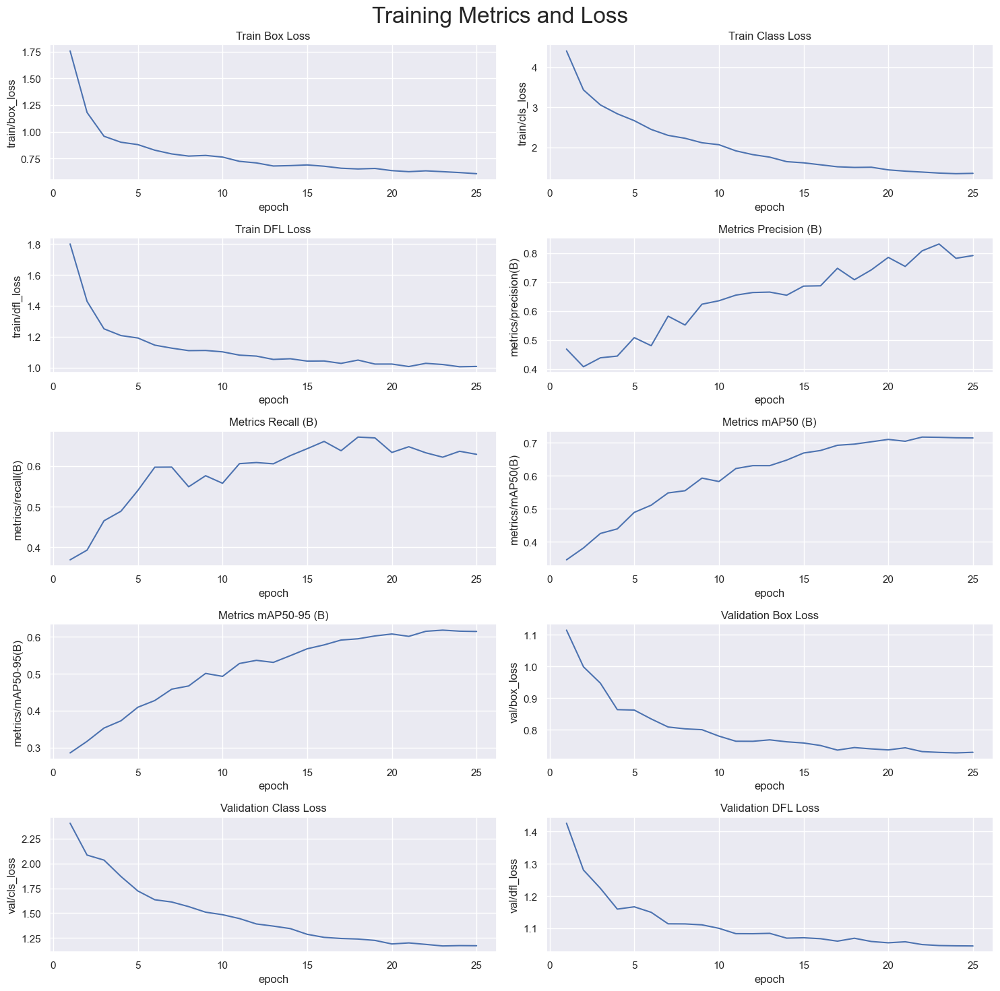

In [27]:
# Plotting training metrics
plot_training_metrics(results_training_fewshot)

In [30]:
# Loading the best performing model
Valid_model = YOLO(os.path.join((os.getcwd()),"runs","detect","few_shot_training_13","weights","best.pt"))

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val',
                        name='few_shot_best_model_13')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 97.977.7 MB/s, size: 17.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:07<00:00,  6.75it/s]


                   all        801        944      0.829      0.621      0.717      0.617
           Green Light         87        122      0.863      0.295      0.502      0.293
             Red Light         74        108      0.929      0.269      0.559      0.321
       Speed Limit 100         52         52      0.767      0.558      0.645      0.584
       Speed Limit 110         17         17      0.589      0.647      0.522      0.487
       Speed Limit 120         60         60      0.954       0.65      0.764      0.682
        Speed Limit 20         56         56      0.915      0.893      0.895      0.764
        Speed Limit 30         71         74      0.906      0.716      0.819      0.746
        Speed Limit 40         53         55      0.825      0.688      0.784      0.685
        Speed Limit 50         68         71      0.768      0.606      0.705      0.632
        Speed Limit 60         76         76       0.93      0.701      0.808      0.727
        Speed Limit 7


0: 640x640 1 Speed Limit 30, 16.6ms
Speed: 3.4ms preprocess, 16.6ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 17.9ms
Speed: 3.6ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 16.8ms
Speed: 2.7ms preprocess, 16.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 15.4ms
Speed: 2.9ms preprocess, 15.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 40, 2 Speed Limit 70s, 14.4ms
Speed: 3.4ms preprocess, 14.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 14.6ms
Speed: 2.7ms preprocess, 14.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 14.3ms
Speed: 3.1ms preprocess, 14.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 13.7ms
Speed: 2.8ms preprocess,

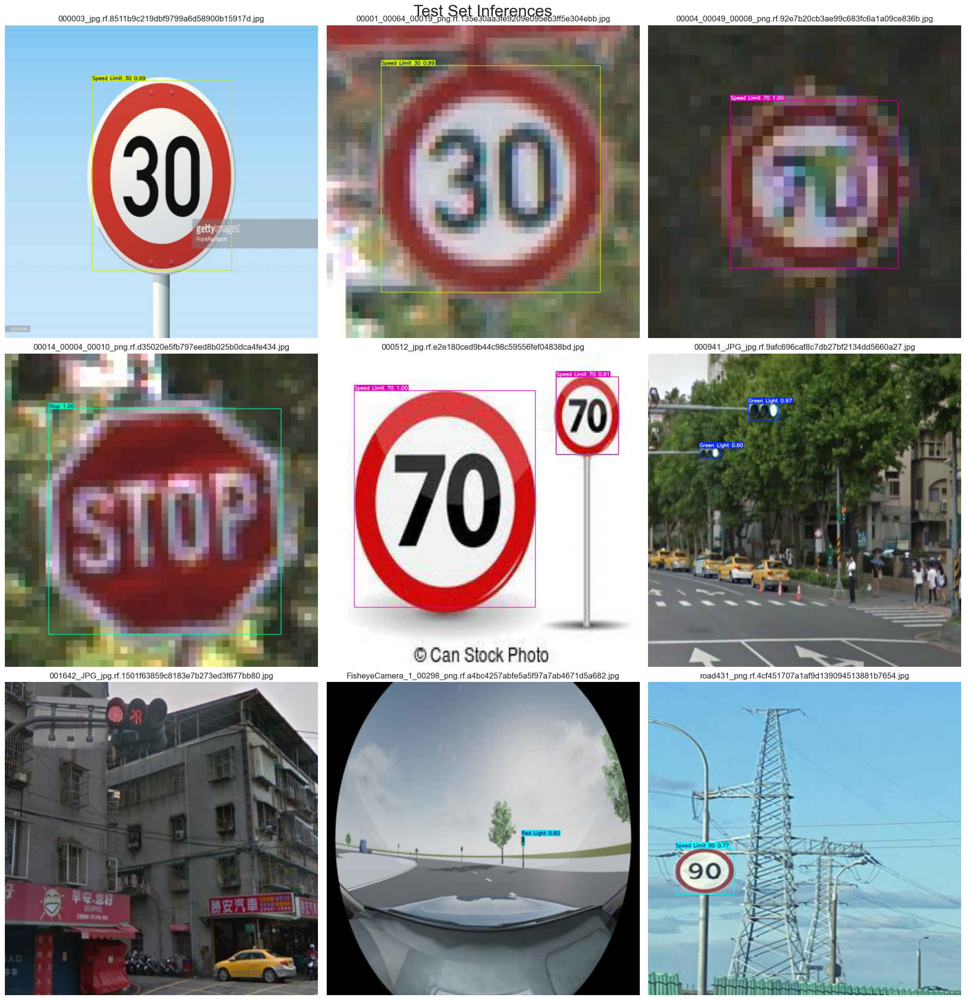

In [31]:
# Display a few predictions of the best model
visualize_model_predictions(Valid_model, dataset_root='data', split='test', max_images=9)

## Model 3: Training with 25% of Dataset

In [32]:
# Creating the data set
train_label_counts_df = pd.DataFrame(train_label_counts_df)  # label counts dataframe
create_few_shot_dataset(path, 0.25, train_label_counts_df, skip_classes=['2'])

Few-shot dataset created with 1064 images at 25.0%


In [33]:
# Train the Model !!
cfg_path = os.path.join(os.getcwd(), 'data', 'few_shot_data_25.yaml')

result_baseline = baseline_model.train(
    data=cfg_path,
    epochs=25,
    batch=4,
    optimizer='auto',
    name='few_shot_training_25', 
    mosaic=0.0,      # no mosaic augmentation
    hsv_h=0.0, hsv_s=0.0, hsv_v=0.0,  # no HSV color jitter
    fliplr=0.0,      # no horizontal flips
    flipud=0.0       # no vertical flips
)

New https://pypi.org/project/ultralytics/8.3.156 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_data_25.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=y

train: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_25pct\labels... 1064 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1064/1064 [00:02<00:00, 408.23it/s]


train: New cache created: C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_25pct\labels.cache
val: Fast image access  (ping: 0.10.0 ms, read: 157.172.1 MB/s, size: 21.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs\detect\few_shot_training_25\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\few_shot_training_25
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25     0.945G     0.7033      1.747      1.073          4        640: 100%|██████████| 266/266 [00:25<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.54it/s]

                   all        801        944      0.734      0.668      0.714      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25     0.945G     0.7185      1.654      1.078          6        640: 100%|██████████| 266/266 [00:22<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.79it/s]


                   all        801        944       0.72      0.662      0.705      0.603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25     0.947G     0.7282      1.607       1.08          3        640: 100%|██████████| 266/266 [00:21<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.79it/s]

                   all        801        944      0.767      0.664      0.728      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25     0.947G     0.7077      1.468      1.064          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.63it/s]

                   all        801        944       0.82      0.663      0.747      0.638



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25     0.947G     0.6915      1.326      1.051          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.68it/s]

                   all        801        944      0.823      0.677      0.753      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25     0.947G      0.686      1.281      1.048          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.90it/s]

                   all        801        944      0.829      0.698      0.775      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25     0.947G     0.6834      1.177      1.033          6        640: 100%|██████████| 266/266 [00:21<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.92it/s]

                   all        801        944      0.822      0.711      0.783      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25     0.947G     0.6748       1.13      1.019          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.74it/s]

                   all        801        944      0.884      0.707        0.8      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25     0.947G      0.646      1.062      1.028          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.84it/s]

                   all        801        944      0.851      0.749      0.807      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25     0.947G     0.6423      1.003      1.009          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.38it/s]

                   all        801        944      0.882      0.721      0.806      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25     0.947G     0.6455     0.9679      1.025          6        640: 100%|██████████| 266/266 [00:21<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.74it/s]

                   all        801        944      0.856      0.758      0.819      0.709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25     0.947G     0.6385     0.9298     0.9992          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.79it/s]

                   all        801        944      0.897      0.741      0.822      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25     0.947G     0.6218     0.9089     0.9983          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.76it/s]

                   all        801        944      0.874      0.734      0.817      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25     0.947G     0.5987     0.8509     0.9911          5        640: 100%|██████████| 266/266 [00:21<00:00, 12.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.49it/s]

                   all        801        944      0.891      0.752      0.837      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25     0.947G     0.6044     0.8184     0.9752          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.82it/s]

                   all        801        944        0.9      0.768      0.842      0.727


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25     0.947G     0.5884     0.8088     0.9861          4        640: 100%|██████████| 266/266 [00:22<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.05it/s]

                   all        801        944      0.913      0.744      0.842      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25     0.947G     0.5906     0.7703     0.9696          3        640: 100%|██████████| 266/266 [00:21<00:00, 12.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.82it/s]

                   all        801        944      0.857      0.767      0.831      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25     0.947G      0.584     0.7591     0.9678          4        640: 100%|██████████| 266/266 [00:22<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.08it/s]

                   all        801        944        0.9      0.756      0.844      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25     0.947G     0.5704     0.7489     0.9696          5        640: 100%|██████████| 266/266 [00:21<00:00, 12.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.96it/s]

                   all        801        944      0.893      0.756      0.846       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25     0.947G     0.5664     0.7267     0.9719          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.85it/s]

                   all        801        944      0.912      0.737      0.845      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25     0.947G      0.561     0.7061     0.9591          5        640: 100%|██████████| 266/266 [00:21<00:00, 12.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.16it/s]


                   all        801        944      0.924      0.752      0.852      0.736

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25     0.947G     0.5559     0.7127     0.9617          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.35it/s]


                   all        801        944      0.927      0.753      0.852      0.739

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25     0.947G     0.5477      0.679     0.9537          4        640: 100%|██████████| 266/266 [00:20<00:00, 12.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.45it/s]


                   all        801        944      0.911      0.764      0.854      0.741

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25     0.947G     0.5445     0.6767     0.9562          5        640: 100%|██████████| 266/266 [00:20<00:00, 12.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.09it/s]

                   all        801        944      0.922      0.758      0.852      0.739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25     0.947G     0.5368     0.6715      0.945          4        640: 100%|██████████| 266/266 [00:21<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.01it/s]

                   all        801        944      0.929      0.751      0.854      0.741



25 epochs completed in 0.210 hours.
Optimizer stripped from runs\detect\few_shot_training_25\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\few_shot_training_25\weights\best.pt, 6.3MB

Validating runs\detect\few_shot_training_25\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 16.14it/s]


                   all        801        944      0.929      0.751      0.854      0.741
           Green Light         87        122       0.89      0.443      0.648      0.373
             Red Light         74        108      0.882      0.414      0.635      0.387
       Speed Limit 100         52         52      0.897      0.672      0.814      0.752
       Speed Limit 110         17         17      0.841      0.824      0.838      0.775
       Speed Limit 120         60         60      0.929       0.75      0.874      0.791
        Speed Limit 20         56         56      0.995      0.893      0.945      0.831
        Speed Limit 30         71         74      0.977      0.851      0.934       0.86
        Speed Limit 40         53         55      0.903      0.849      0.933      0.808
        Speed Limit 50         68         71      0.982       0.77      0.892      0.808
        Speed Limit 60         76         76      0.962      0.803      0.892      0.811
        Speed Limit 7

In [34]:
results_training_fewshot = pd.read_csv(os.path.join((os.getcwd()),"runs","detect","few_shot_training_25","results.csv"))
results_training_fewshot.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
15,16,494.892,0.58839,0.80878,0.98609,0.91311,0.74379,0.84176,0.72670,0.68275,0.82032,1.00584,0.000214,0.000214,0.000214
16,17,524.503,0.59055,0.77025,0.96959,0.85680,0.76681,0.83148,0.71658,0.68726,0.81261,1.00035,0.000193,0.000193,0.000193
17,18,554.254,0.58397,0.75913,0.96783,0.89996,0.75560,0.84450,0.73059,0.68306,0.79210,1.00114,0.000172,0.000172,0.000172
18,19,583.334,0.57045,0.74887,0.96961,0.89304,0.75563,0.84584,0.73027,0.68144,0.77025,1.00473,0.000151,0.000151,0.000151
19,20,612.296,0.56638,0.72672,0.97186,0.91164,0.73709,0.84538,0.72872,0.68012,0.77622,1.00229,0.000130,0.000130,0.000130
20,21,641.021,0.56098,0.70610,0.95910,0.92408,0.75172,0.85186,0.73601,0.67628,0.76609,1.00249,0.000109,0.000109,0.000109
21,22,669.453,0.55589,0.71266,0.96170,0.92736,0.75324,0.85221,0.73855,0.66971,0.75501,0.99410,0.000089,0.000089,0.000089
22,23,697.573,0.54770,0.67896,0.95373,0.91135,0.76429,0.85375,0.74112,0.66966,0.75058,0.99582,0.000068,0.000068,0.000068
23,24,725.923,0.54450,0.67667,0.95618,0.92159,0.75794,0.85187,0.73932,0.66701,0.74260,0.99388,0.000047,0.000047,0.000047
24,25,754.785,0.53677,0.67150,0.94495,0.92877,0.75079,0.85432,0.74130,0.66520,0.74146,0.99246,0.000026,0.000026,0.000026


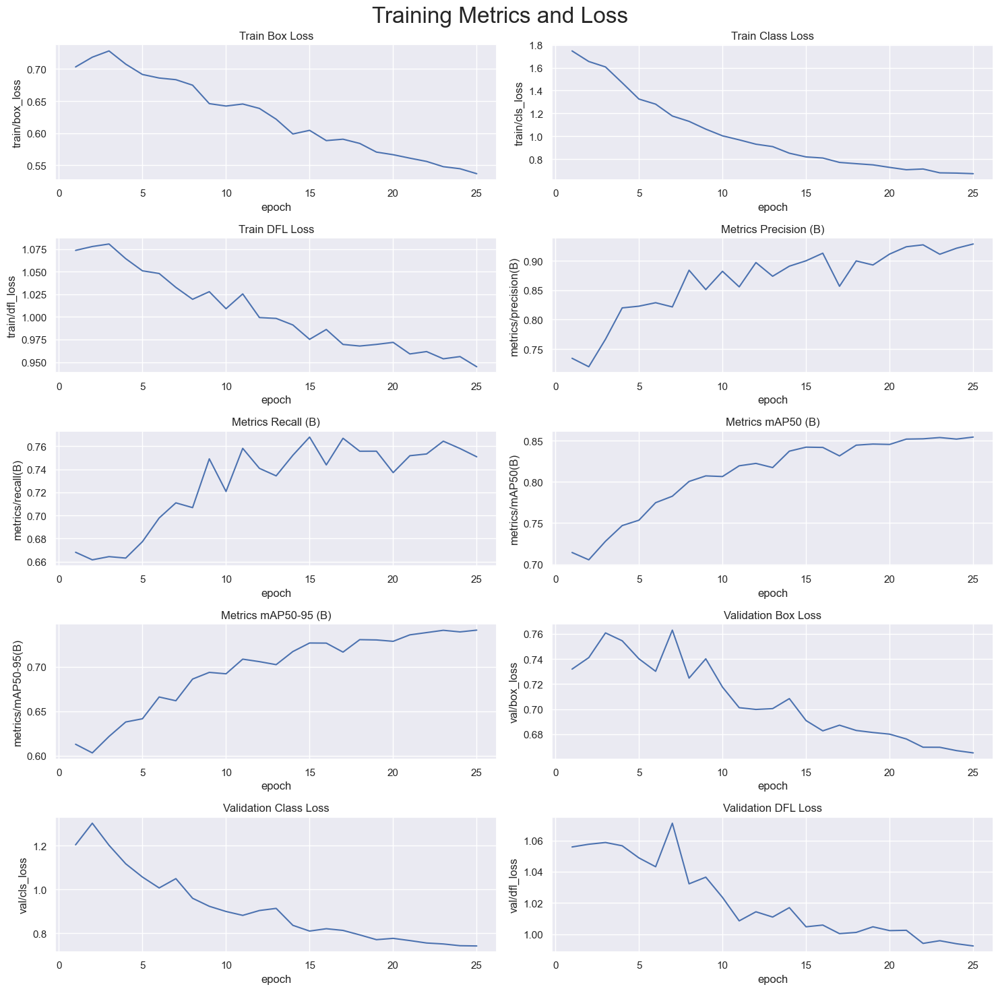

In [35]:
# Plotting training metrics
plot_training_metrics(results_training_fewshot)

In [36]:
# Validation
metrics = baseline_model.val(
    data=cfg_path,
    imgsz=416,
    batch=16,
    save=True,                # save images with boxes
    plots=True,               # save PR-curves, confusion matrix, etc.
    name='few_shot_val_25', 
    exist_ok=True             # overwrite if it already exists
)

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 123.545.1 MB/s, size: 16.0 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:05<00:00,  9.33it/s]


                   all        801        944      0.874      0.692      0.791      0.685
           Green Light         87        122      0.836      0.417      0.544      0.288
             Red Light         74        108      0.831      0.319      0.487      0.279
       Speed Limit 100         52         52      0.905      0.615      0.777        0.7
       Speed Limit 110         17         17      0.802      0.717      0.787      0.739
       Speed Limit 120         60         60      0.846       0.75      0.837       0.76
        Speed Limit 20         56         56       0.98       0.86      0.913       0.78
        Speed Limit 30         71         74      0.904       0.77      0.876      0.793
        Speed Limit 40         53         55       0.83      0.797      0.856      0.749
        Speed Limit 50         68         71      0.881      0.732      0.829      0.747
        Speed Limit 60         76         76      0.867      0.829      0.879      0.796
        Speed Limit 7

In [38]:
# Loading the best performing model
Valid_model = YOLO(os.path.join((os.getcwd()),"runs","detect","few_shot_training_25","weights","best.pt"))

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val',
                        name='few_shot_best_model_25')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 138.785.3 MB/s, size: 17.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:07<00:00,  6.97it/s]


                   all        801        944      0.929      0.751      0.855      0.742
           Green Light         87        122      0.891      0.443      0.648      0.372
             Red Light         74        108      0.881      0.411      0.644      0.389
       Speed Limit 100         52         52      0.897      0.671      0.813      0.752
       Speed Limit 110         17         17      0.841      0.824      0.839      0.776
       Speed Limit 120         60         60      0.929       0.75      0.874      0.791
        Speed Limit 20         56         56      0.995      0.893      0.945      0.828
        Speed Limit 30         71         74      0.977      0.851      0.935      0.862
        Speed Limit 40         53         55      0.903      0.849      0.933       0.81
        Speed Limit 50         68         71      0.982       0.77      0.892      0.809
        Speed Limit 60         76         76      0.962      0.803      0.892       0.81
        Speed Limit 7


0: 640x640 1 Speed Limit 30, 19.0ms
Speed: 4.8ms preprocess, 19.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 19.0ms
Speed: 3.3ms preprocess, 19.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 19.1ms
Speed: 2.8ms preprocess, 19.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 19.1ms
Speed: 2.9ms preprocess, 19.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Speed Limit 70s, 19.3ms
Speed: 2.6ms preprocess, 19.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 18.9ms
Speed: 2.5ms preprocess, 18.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Red Lights, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 13.8ms
Speed: 2.5ms preprocess, 13.8ms inference

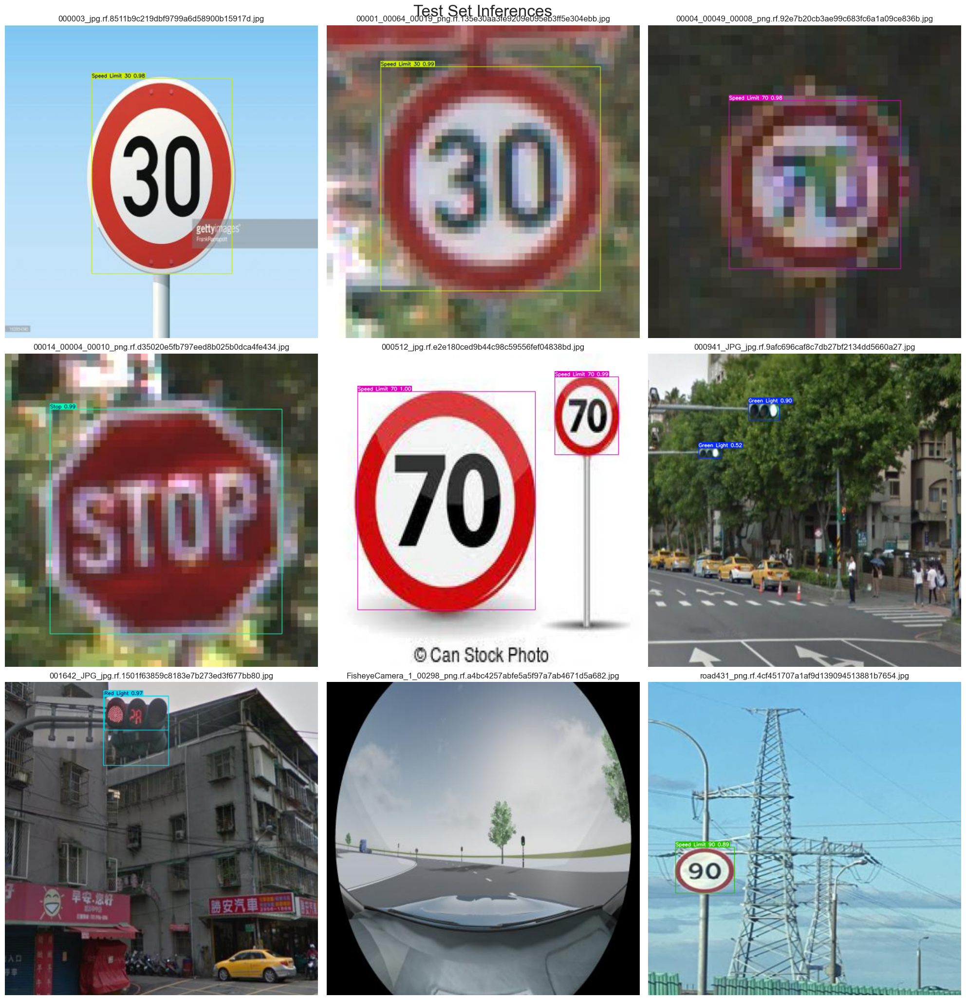

In [39]:
# Display a few predictions of the best model
visualize_model_predictions(Valid_model, dataset_root='data', split='test', max_images=9)

## Model 4: Training with 50% of Dataset

In [40]:
# Creating the data set
train_label_counts_df = pd.DataFrame(train_label_counts_df)  # label counts dataframe
create_few_shot_dataset(path, 0.50, train_label_counts_df, skip_classes=['2'])

Few-shot dataset created with 2103 images at 50.0%


In [41]:
# Train the Model !!
cfg_path = os.path.join(os.getcwd(), 'data', 'few_shot_data_50.yaml')

result_baseline = baseline_model.train(
    data=cfg_path,
    epochs=25,
    batch=4,
    optimizer='auto',
    name='few_shot_training_50', 
    mosaic=0.0,      # no mosaic augmentation
    hsv_h=0.0, hsv_s=0.0, hsv_v=0.0,  # no HSV color jitter
    fliplr=0.0,      # no horizontal flips
    flipud=0.0       # no vertical flips
)

New https://pypi.org/project/ultralytics/8.3.156 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_data_50.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=y

train: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_50pct\labels... 2103 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2103/2103 [00:05<00:00, 416.25it/s]


train: New cache created: C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\few_shot_50pct\labels.cache
val: Fast image access  (ping: 0.10.0 ms, read: 79.034.0 MB/s, size: 21.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs\detect\few_shot_training_50\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\few_shot_training_50
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25     0.947G     0.6057      0.894     0.9858          3        640: 100%|██████████| 526/526 [00:47<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.76it/s]

                   all        801        944      0.901      0.764      0.841      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25     0.949G     0.6214      0.906     0.9896          3        640: 100%|██████████| 526/526 [00:43<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.32it/s]

                   all        801        944      0.908      0.725      0.842      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25     0.949G     0.6313     0.8485      1.007          3        640: 100%|██████████| 526/526 [00:43<00:00, 12.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.38it/s]

                   all        801        944       0.92      0.755      0.851      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25     0.949G     0.6227     0.7979     0.9945          3        640: 100%|██████████| 526/526 [00:44<00:00, 11.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.56it/s]

                   all        801        944      0.907       0.75      0.848      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25     0.949G     0.6278     0.7634     0.9924          3        640: 100%|██████████| 526/526 [00:43<00:00, 12.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.80it/s]


                   all        801        944      0.917      0.764       0.85      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25     0.949G     0.6097     0.7016     0.9848          4        640: 100%|██████████| 526/526 [00:42<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.64it/s]

                   all        801        944      0.911      0.771      0.855      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25     0.949G     0.6045     0.6658     0.9841          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.99it/s]

                   all        801        944      0.887      0.773      0.862      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25     0.949G      0.603     0.6267     0.9744          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.71it/s]

                   all        801        944      0.895      0.789       0.87      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25     0.949G     0.5928     0.6118     0.9722          3        640: 100%|██████████| 526/526 [00:43<00:00, 12.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.94it/s]

                   all        801        944      0.923       0.77      0.866      0.747



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25     0.949G     0.5848     0.5859     0.9648          4        640: 100%|██████████| 526/526 [00:42<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.07it/s]


                   all        801        944      0.934      0.779      0.869       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25     0.949G     0.5773     0.5736     0.9593          3        640: 100%|██████████| 526/526 [00:43<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.15it/s]

                   all        801        944      0.933      0.782      0.873      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25     0.949G     0.5777     0.5499     0.9572          3        640: 100%|██████████| 526/526 [00:41<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.29it/s]

                   all        801        944      0.933      0.788      0.878      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25     0.949G     0.5599     0.5275      0.948          3        640: 100%|██████████| 526/526 [00:41<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.51it/s]

                   all        801        944      0.949      0.793      0.881      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25     0.949G     0.5597     0.5316     0.9468          4        640: 100%|██████████| 526/526 [00:41<00:00, 12.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.52it/s]


                   all        801        944      0.951      0.782      0.884      0.767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25     0.949G     0.5513     0.5058     0.9413          3        640: 100%|██████████| 526/526 [00:40<00:00, 12.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.79it/s]

                   all        801        944      0.927      0.804      0.885      0.766


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25     0.949G     0.5429     0.4969     0.9427          4        640: 100%|██████████| 526/526 [00:43<00:00, 11.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.97it/s]

                   all        801        944      0.927      0.803      0.887      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25     0.949G     0.5422     0.4895     0.9434          5        640: 100%|██████████| 526/526 [00:43<00:00, 12.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.83it/s]

                   all        801        944      0.946        0.8      0.881      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25     0.949G     0.5351      0.473     0.9291          4        640: 100%|██████████| 526/526 [00:43<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.96it/s]

                   all        801        944      0.943      0.803      0.887      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25     0.949G     0.5217     0.4524     0.9279          3        640: 100%|██████████| 526/526 [00:43<00:00, 12.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.00it/s]

                   all        801        944       0.95      0.784       0.89      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25     0.949G     0.5182      0.453     0.9207          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.18it/s]

                   all        801        944      0.933      0.802      0.888      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25     0.949G     0.5127     0.4433     0.9189          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.94it/s]

                   all        801        944       0.94      0.799       0.89      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25     0.949G     0.5113     0.4311     0.9183          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.70it/s]

                   all        801        944      0.949      0.805      0.892      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25     0.949G     0.5023     0.4296     0.9135          3        640: 100%|██████████| 526/526 [00:42<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.12it/s]

                   all        801        944      0.929      0.805      0.892      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25     0.949G     0.5005     0.4227     0.9107          4        640: 100%|██████████| 526/526 [00:43<00:00, 12.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.60it/s]

                   all        801        944      0.956      0.797      0.892      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25     0.949G     0.5013     0.4196     0.9185          2        640: 100%|██████████| 526/526 [00:43<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.82it/s]

                   all        801        944      0.949      0.805      0.895      0.785



25 epochs completed in 0.358 hours.
Optimizer stripped from runs\detect\few_shot_training_50\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\few_shot_training_50\weights\best.pt, 6.3MB

Validating runs\detect\few_shot_training_50\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 15.74it/s]


                   all        801        944      0.951      0.805      0.895      0.785
           Green Light         87        122      0.908      0.549      0.752      0.447
             Red Light         74        108      0.934      0.546      0.731      0.429
       Speed Limit 100         52         52      0.933      0.802      0.901      0.832
       Speed Limit 110         17         17      0.894      0.824      0.913      0.867
       Speed Limit 120         60         60      0.965      0.833      0.903      0.838
        Speed Limit 20         56         56      0.991      0.893      0.978      0.854
        Speed Limit 30         71         74      0.971      0.912      0.947      0.882
        Speed Limit 40         53         55       0.89      0.883      0.941      0.841
        Speed Limit 50         68         71      0.967      0.817      0.929      0.847
        Speed Limit 60         76         76       0.97       0.86      0.924      0.844
        Speed Limit 7

In [42]:
results_training_fewshot = pd.read_csv(os.path.join((os.getcwd()),"runs","detect","few_shot_training_50","results.csv"))
results_training_fewshot.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
15,16,832.085,0.54293,0.49686,0.94267,0.92683,0.80315,0.88657,0.77203,0.63720,0.61877,0.96705,0.000214,0.000214,0.000214
16,17,882.926,0.54215,0.48951,0.94340,0.94630,0.80043,0.88129,0.76627,0.64430,0.61164,0.96901,0.000193,0.000193,0.000193
17,18,934.034,0.53510,0.47299,0.92912,0.94339,0.80274,0.88745,0.77172,0.63788,0.59996,0.96678,0.000172,0.000172,0.000172
18,19,985.358,0.52171,0.45236,0.92785,0.94999,0.78449,0.88953,0.77944,0.63169,0.58738,0.96214,0.000151,0.000151,0.000151
19,20,1035.520,0.51820,0.45297,0.92073,0.93312,0.80175,0.88814,0.77664,0.62941,0.58151,0.96485,0.000130,0.000130,0.000130
20,21,1086.010,0.51270,0.44328,0.91885,0.94046,0.79895,0.88962,0.77914,0.62680,0.58281,0.96368,0.000109,0.000109,0.000109
21,22,1136.540,0.51133,0.43111,0.91832,0.94899,0.80517,0.89242,0.78074,0.62427,0.58088,0.96241,0.000089,0.000089,0.000089
22,23,1186.870,0.50230,0.42955,0.91350,0.92857,0.80508,0.89164,0.78106,0.62841,0.57173,0.96552,0.000068,0.000068,0.000068
23,24,1238.060,0.50047,0.42267,0.91070,0.95626,0.79698,0.89245,0.78276,0.62412,0.56952,0.96277,0.000047,0.000047,0.000047
24,25,1289.040,0.50128,0.41959,0.91854,0.94943,0.80526,0.89483,0.78518,0.62350,0.56607,0.95948,0.000026,0.000026,0.000026


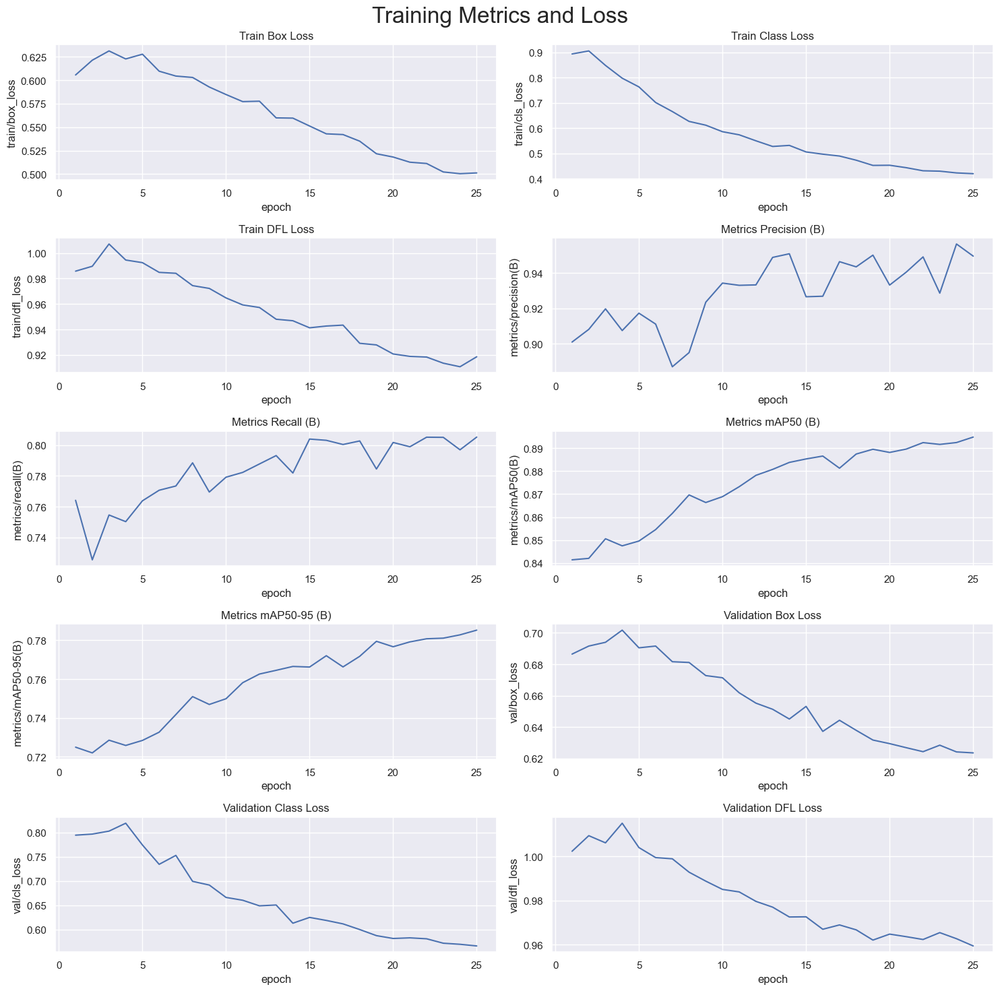

In [43]:
# Plotting training metrics
plot_training_metrics(results_training_fewshot)

In [46]:
# Loading the best performing model
Valid_model = YOLO(os.path.join((os.getcwd()),"runs","detect","few_shot_training_50","weights","best.pt"))

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val',
                        name='few_shot_best_model_50')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 165.198.8 MB/s, size: 17.4 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:07<00:00,  6.86it/s]


                   all        801        944       0.95      0.805      0.894      0.785
           Green Light         87        122      0.907      0.549      0.748      0.454
             Red Light         74        108      0.926      0.546      0.728      0.426
       Speed Limit 100         52         52      0.933      0.803      0.901      0.833
       Speed Limit 110         17         17      0.893      0.824      0.913      0.867
       Speed Limit 120         60         60      0.964      0.833      0.903      0.837
        Speed Limit 20         56         56      0.991      0.893      0.978      0.854
        Speed Limit 30         71         74      0.971      0.912      0.947      0.883
        Speed Limit 40         53         55       0.89      0.885      0.941       0.84
        Speed Limit 50         68         71      0.965      0.817      0.929      0.845
        Speed Limit 60         76         76       0.97       0.86      0.924      0.844
        Speed Limit 7


0: 640x640 1 Speed Limit 30, 16.1ms
Speed: 3.1ms preprocess, 16.1ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 16.3ms
Speed: 2.9ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 16.7ms
Speed: 2.6ms preprocess, 16.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 16.8ms
Speed: 2.7ms preprocess, 16.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Speed Limit 70s, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 12.9ms
Speed: 2.6ms preprocess, 12.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 12.4ms
Speed: 3.8ms preprocess, 12.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 12.3ms
Speed: 2.9ms preprocess, 12.3ms inference,

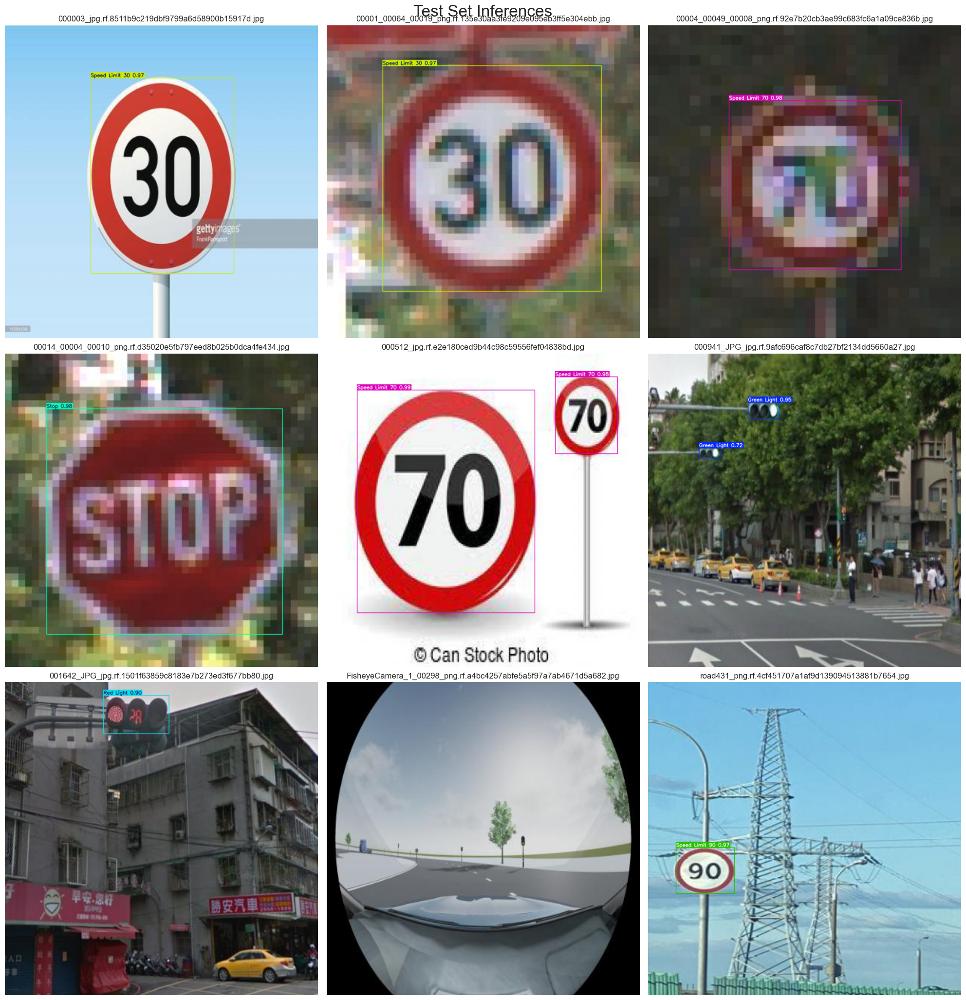

In [47]:
# Display a few predictions of the best model
visualize_model_predictions(Valid_model, dataset_root='data', split='test', max_images=9)

## Model 5: Training with Full Dataset

In [2]:
# Build from YAML and transfer weights
baseline_model = YOLO('yolov8n.pt')  

# Train the Model !!
cfg_path = os.path.join(os.getcwd(), 'data', 'data.yaml')

result_baseline = baseline_model.train(
    data=cfg_path,
    epochs=50,
    batch=4,
    optimizer='auto',
    name='full_model_training', 
    mosaic=0.0,      # no mosaic augmentation
    hsv_h=0.0, hsv_s=0.0, hsv_v=0.0,  # no HSV color jitter
    fliplr=0.0,      # no horizontal flips
    flipud=0.0     # no vertical flips
)

New https://pypi.org/project/ultralytics/8.3.156 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=c:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.0, hsv_s=0.0, hsv_v=0.0, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, m

2025-06-19 19:53:49,179	INFO util.py:154 -- Missing packages: ['ipywidgets']. Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

train: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\train\labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]


val: Fast image access  (ping: 0.30.1 ms, read: 17.99.8 MB/s, size: 20.7 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]


Plotting labels to runs\detect\full_model_training\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\full_model_training
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50     0.592G     0.8948      4.053      1.211          2        640: 100%|██████████| 883/883 [01:18<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.50it/s]

                   all        801        944      0.276      0.474       0.32      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50     0.654G     0.7948      2.821      1.094          5        640: 100%|██████████| 883/883 [01:09<00:00, 12.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.92it/s]

                   all        801        944      0.549      0.583      0.597      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50     0.654G     0.7699       1.97      1.076          3        640: 100%|██████████| 883/883 [01:09<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.17it/s]

                   all        801        944      0.681      0.686      0.725      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50     0.654G     0.7264      1.467      1.059          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.23it/s]

                   all        801        944      0.815      0.717      0.801      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50     0.654G     0.6996      1.182      1.026          4        640: 100%|██████████| 883/883 [01:10<00:00, 12.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.14it/s]

                   all        801        944      0.901      0.771      0.859      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50     0.654G     0.6868     0.9831      1.019          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.04it/s]

                   all        801        944      0.871      0.781      0.874      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50     0.654G     0.6648     0.8726      1.005          2        640: 100%|██████████| 883/883 [01:08<00:00, 12.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.32it/s]

                   all        801        944      0.878      0.814       0.89      0.748



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50     0.654G     0.6529     0.7956      1.002          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.94it/s]

                   all        801        944      0.897      0.816      0.896      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50     0.654G     0.6359     0.7364     0.9784          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.29it/s]

                   all        801        944      0.905      0.827      0.904      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50     0.654G     0.6344     0.7016     0.9828          2        640: 100%|██████████| 883/883 [01:08<00:00, 12.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.29it/s]


                   all        801        944      0.938      0.839       0.91      0.773

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50     0.654G      0.624     0.6548     0.9783          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.23it/s]


                   all        801        944      0.953      0.825      0.917      0.777

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50     0.654G      0.613     0.6329     0.9702          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.11it/s]


                   all        801        944      0.927      0.845      0.924       0.78

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50     0.654G     0.6062     0.5958     0.9639          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.33it/s]

                   all        801        944      0.943      0.859      0.934       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50     0.654G     0.5952      0.579     0.9601          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.37it/s]

                   all        801        944      0.925      0.859      0.934      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50     0.654G     0.5992     0.5587     0.9566          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.92it/s]

                   all        801        944      0.963      0.856      0.942      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50     0.654G     0.5806     0.5447      0.945          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.06it/s]

                   all        801        944       0.95      0.858      0.932      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50     0.654G     0.5695     0.5138     0.9467          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.49it/s]


                   all        801        944      0.955      0.867      0.944      0.803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50     0.654G     0.5716     0.5057     0.9484          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.35it/s]

                   all        801        944      0.939      0.894      0.947      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50     0.654G     0.5638     0.4793     0.9456          3        640: 100%|██████████| 883/883 [01:09<00:00, 12.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.08it/s]

                   all        801        944       0.93       0.87      0.947      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50     0.654G     0.5603      0.464     0.9405          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.18it/s]

                   all        801        944       0.94      0.876      0.945      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50     0.654G     0.5509      0.465     0.9338          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.86it/s]

                   all        801        944      0.956      0.891      0.954      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50     0.654G     0.5532     0.4552     0.9325          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.28it/s]

                   all        801        944      0.934      0.899      0.957      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50     0.654G      0.545     0.4405       0.93          4        640: 100%|██████████| 883/883 [01:09<00:00, 12.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.38it/s]

                   all        801        944      0.933      0.899      0.958      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50     0.654G     0.5456     0.4347     0.9273          2        640: 100%|██████████| 883/883 [01:08<00:00, 12.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.99it/s]

                   all        801        944      0.939      0.885      0.954      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50     0.654G     0.5345     0.4137     0.9217          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.18it/s]


                   all        801        944      0.941      0.889      0.956      0.821

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50     0.654G     0.5299     0.4138     0.9168          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.64it/s]

                   all        801        944      0.928      0.924      0.961      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50     0.654G     0.5187     0.4017     0.9119          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.17it/s]

                   all        801        944      0.942      0.911      0.961      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50     0.654G     0.5179     0.3935     0.9145          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.36it/s]

                   all        801        944      0.959      0.895      0.959      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50     0.654G     0.5165     0.3846     0.9094          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.35it/s]

                   all        801        944      0.932      0.911      0.965      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50     0.654G     0.5063     0.3712      0.905          1        640: 100%|██████████| 883/883 [01:09<00:00, 12.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.84it/s]

                   all        801        944      0.944      0.916       0.96      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50     0.654G     0.5025     0.3651     0.9041          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.46it/s]

                   all        801        944      0.937      0.915      0.963      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50     0.654G     0.4969     0.3609     0.8978          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.03it/s]

                   all        801        944      0.933      0.925      0.961      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50     0.654G     0.4925     0.3532     0.9035          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.22it/s]

                   all        801        944      0.933      0.927      0.962      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50     0.654G      0.486     0.3445     0.8954          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.30it/s]

                   all        801        944       0.95      0.915      0.963      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50     0.654G     0.4836     0.3416     0.8963          3        640: 100%|██████████| 883/883 [01:09<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.50it/s]

                   all        801        944      0.947      0.918      0.966      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50     0.654G     0.4783     0.3386     0.8922          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.28it/s]

                   all        801        944      0.941      0.916      0.961      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50     0.654G     0.4725     0.3252      0.895          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.33it/s]

                   all        801        944      0.948      0.931      0.965       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50     0.654G     0.4704     0.3253     0.8877          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.47it/s]

                   all        801        944      0.934       0.93      0.964       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50     0.654G     0.4606     0.3122     0.8861          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.34it/s]

                   all        801        944      0.936      0.934      0.966      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50     0.654G     0.4632     0.3119     0.8848          1        640: 100%|██████████| 883/883 [01:10<00:00, 12.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.33it/s]

                   all        801        944      0.942      0.924      0.965      0.832


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50     0.654G     0.4542     0.3084     0.8798          3        640: 100%|██████████| 883/883 [01:10<00:00, 12.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.36it/s]

                   all        801        944      0.949      0.923      0.965      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50     0.654G     0.4528     0.3022     0.8805          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.19it/s]


                   all        801        944      0.952      0.926      0.965      0.831

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50     0.654G      0.445     0.2949     0.8763          2        640: 100%|██████████| 883/883 [01:10<00:00, 12.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.25it/s]


                   all        801        944      0.954      0.915      0.967      0.833

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50     0.654G     0.4444     0.2896     0.8785          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 13.77it/s]

                   all        801        944      0.964      0.912      0.968      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50     0.654G     0.4446     0.2929     0.8736          3        640: 100%|██████████| 883/883 [01:08<00:00, 12.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.22it/s]

                   all        801        944      0.956      0.923      0.968      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50     0.654G     0.4351     0.2861     0.8701          2        640: 100%|██████████| 883/883 [01:09<00:00, 12.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.36it/s]


                   all        801        944      0.925      0.951      0.968      0.835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50     0.654G     0.4287     0.2803     0.8696          3        640: 100%|██████████| 883/883 [01:08<00:00, 12.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.36it/s]

                   all        801        944      0.938       0.93      0.965      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50     0.654G     0.4236     0.2775     0.8703          2        640: 100%|██████████| 883/883 [01:08<00:00, 12.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.25it/s]

                   all        801        944      0.937      0.935      0.967      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50     0.654G     0.4231     0.2779     0.8695          2        640: 100%|██████████| 883/883 [01:08<00:00, 12.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 14.92it/s]

                   all        801        944      0.944       0.93      0.968      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50     0.654G     0.4193     0.2746     0.8665          5        640: 100%|██████████| 883/883 [01:08<00:00, 12.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:07<00:00, 14.34it/s]


                   all        801        944      0.941      0.934      0.969       0.84

50 epochs completed in 1.081 hours.
Optimizer stripped from runs\detect\full_model_training\weights\last.pt, 6.3MB
Optimizer stripped from runs\detect\full_model_training\weights\best.pt, 6.3MB

Validating runs\detect\full_model_training\weights\best.pt...
Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:06<00:00, 16.33it/s]


                   all        801        944      0.942      0.935      0.969      0.841
           Green Light         87        122      0.862      0.771      0.855      0.537
             Red Light         74        108      0.855      0.769      0.855      0.526
       Speed Limit 100         52         52      0.936          1      0.993      0.895
       Speed Limit 110         17         17      0.913          1      0.992      0.932
       Speed Limit 120         60         60          1          1      0.995      0.923
        Speed Limit 20         56         56      0.983      0.982      0.987      0.869
        Speed Limit 30         71         74      0.948      0.973      0.992      0.927
        Speed Limit 40         53         55      0.883      0.982      0.989      0.892
        Speed Limit 50         68         71      0.962      0.901       0.98      0.872
        Speed Limit 60         76         76      0.972       0.93      0.976      0.885
        Speed Limit 7

In [3]:
results_training = pd.read_csv(os.path.join((os.getcwd()),"runs","detect","full_model_training","results.csv"))
results_training.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
40,41,3198.86,0.45417,0.30839,0.87981,0.94893,0.92350,0.96451,0.83239,0.58672,0.36694,0.94837,0.000109,0.000109,0.000109
41,42,3277.21,0.45285,0.30218,0.88047,0.95168,0.92611,0.96498,0.83088,0.58759,0.35522,0.94922,0.000099,0.000099,0.000099
42,43,3354.81,0.44505,0.29486,0.87626,0.95439,0.91526,0.96694,0.83294,0.57980,0.36234,0.94034,0.000089,0.000089,0.000089
43,44,3431.89,0.44438,0.28958,0.87852,0.96362,0.91178,0.96779,0.83390,0.58620,0.35553,0.94393,0.000078,0.000078,0.000078
44,45,3508.36,0.44462,0.29291,0.87363,0.95594,0.92289,0.96837,0.83680,0.57926,0.35312,0.94117,0.000068,0.000068,0.000068
45,46,3585.63,0.43513,0.28610,0.87013,0.92499,0.95126,0.96824,0.83474,0.57972,0.35598,0.94337,0.000057,0.000057,0.000057
46,47,3661.78,0.42872,0.28027,0.86961,0.93781,0.93031,0.96452,0.83410,0.57771,0.35276,0.94193,0.000047,0.000047,0.000047
47,48,3738.22,0.42362,0.27753,0.87029,0.93741,0.93521,0.96678,0.83664,0.57509,0.34853,0.94239,0.000037,0.000037,0.000037
48,49,3813.32,0.42314,0.27790,0.86951,0.94380,0.93006,0.96816,0.83765,0.57306,0.34856,0.94020,0.000026,0.000026,0.000026
49,50,3889.60,0.41932,0.27465,0.86652,0.94137,0.93447,0.96908,0.84038,0.57348,0.34703,0.94037,0.000016,0.000016,0.000016


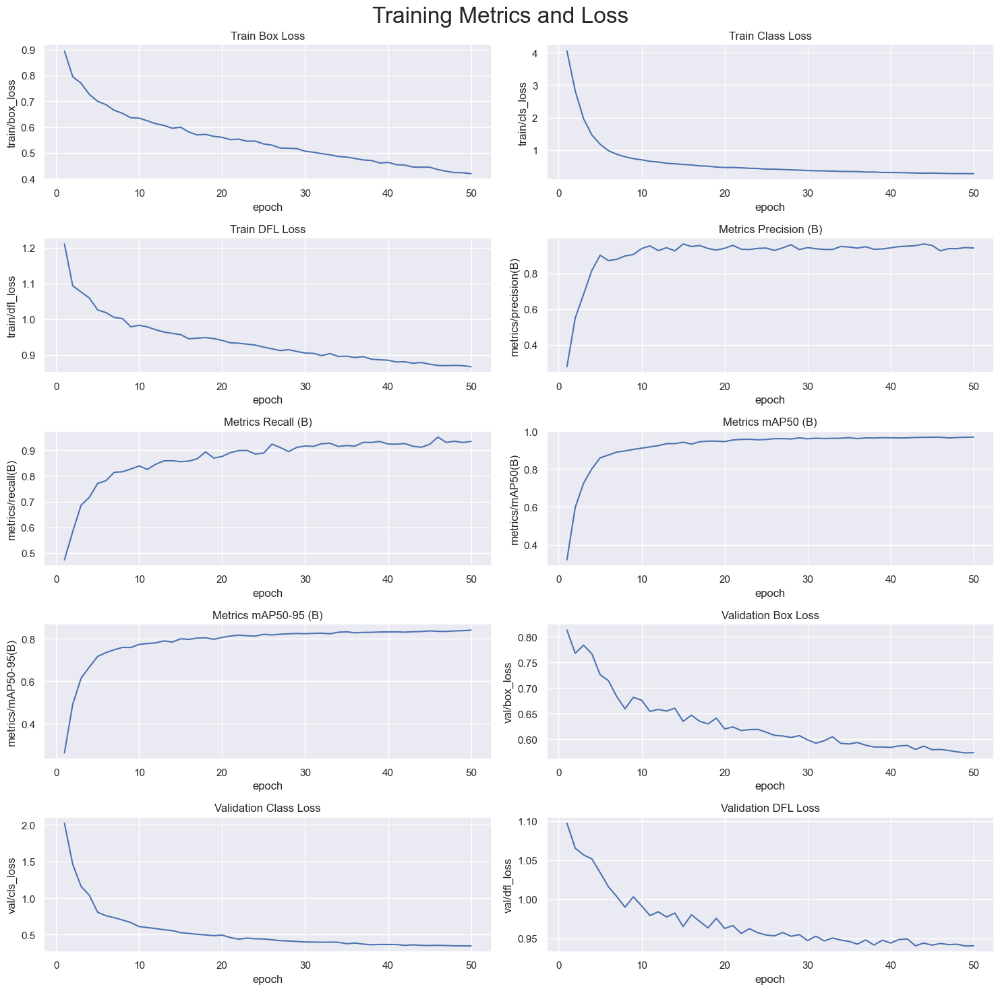

In [22]:
# Plotting training metrics
plot_training_metrics(results_training)

In [23]:
# Validation
metrics = baseline_model.val(
    data=cfg_path,
    imgsz=416,
    batch=16,
    save=True,                # save images with boxes
    plots=True,               # save PR-curves, confusion matrix, etc.
    name='full_model_validation', 
    exist_ok=True             # overwrite if it already exists
)

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 112.556.8 MB/s, size: 19.7 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:05<00:00,  8.57it/s]


                   all        801        944      0.938      0.887      0.935      0.812
           Green Light         87        122      0.854      0.615      0.748      0.449
             Red Light         74        108      0.834       0.63      0.723      0.432
       Speed Limit 100         52         52      0.899          1      0.992       0.89
       Speed Limit 110         17         17      0.916          1      0.995      0.933
       Speed Limit 120         60         60          1      0.969      0.995      0.902
        Speed Limit 20         56         56      0.982      0.973      0.986      0.865
        Speed Limit 30         71         74      0.963      0.959      0.983      0.917
        Speed Limit 40         53         55      0.946      0.953       0.98      0.872
        Speed Limit 50         68         71      0.958      0.859      0.962      0.849
        Speed Limit 60         76         76      0.959      0.882      0.956      0.862
        Speed Limit 7

In [28]:
# Loading the best performing model
Valid_model = YOLO(os.path.join((os.getcwd()),"runs","detect","full_model_training","weights","best.pt"))

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val',
                        name='full_model_best')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.151  Python-3.11.0 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,008,573 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 153.759.0 MB/s, size: 26.2 KB)


val: Scanning C:\Users\aleja\OneDrive\Escritorio\Term_3\High_Dimensional\term_poster\Traffic-Sign-Detection\data\valid\labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:08<00:00,  5.96it/s]


                   all        801        944      0.942      0.935      0.969       0.84
           Green Light         87        122      0.871      0.775      0.855      0.531
             Red Light         74        108      0.857      0.769      0.854       0.53
       Speed Limit 100         52         52      0.936          1      0.993      0.898
       Speed Limit 110         17         17      0.913          1      0.992      0.926
       Speed Limit 120         60         60          1      0.999      0.995      0.924
        Speed Limit 20         56         56      0.983      0.982      0.987      0.871
        Speed Limit 30         71         74      0.948      0.973      0.992      0.924
        Speed Limit 40         53         55      0.883      0.982      0.989      0.888
        Speed Limit 50         68         71      0.962      0.901       0.98      0.872
        Speed Limit 60         76         76      0.972       0.93      0.976      0.887
        Speed Limit 7


0: 640x640 1 Speed Limit 30, 47.8ms
Speed: 10.1ms preprocess, 47.8ms inference, 14.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 24.2ms
Speed: 3.8ms preprocess, 24.2ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 28.0ms
Speed: 5.3ms preprocess, 28.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 30.2ms
Speed: 3.9ms preprocess, 30.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Speed Limit 70s, 25.8ms
Speed: 3.8ms preprocess, 25.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 Green Lights, 28.5ms
Speed: 4.0ms preprocess, 28.5ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 27.5ms
Speed: 4.0ms preprocess, 27.5ms inference, 3.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 1 Red Light, 1 Speed Limit 70, 22.4ms
Speed: 5.4m

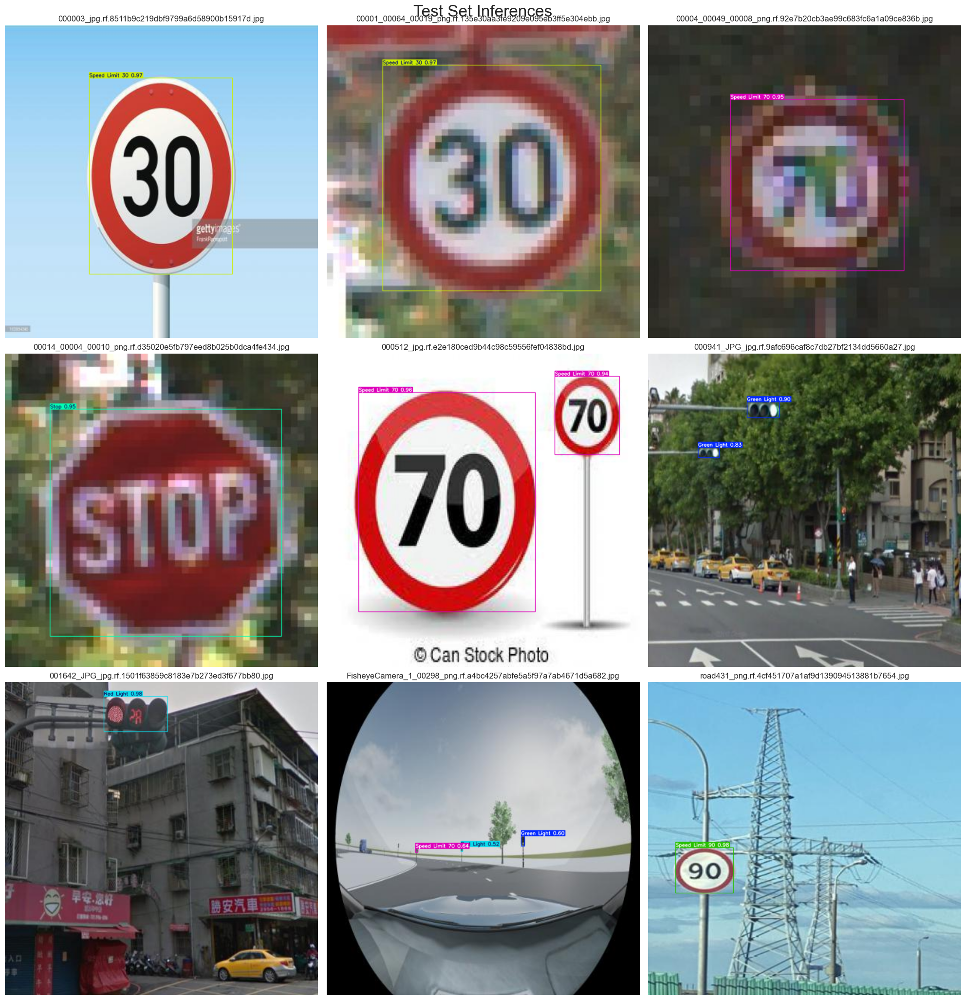

In [31]:
# Display a few predictions of the best model
visualize_model_predictions(Valid_model, dataset_root='data', split='test', max_images=9)